In [1]:
import astropy.io.fits as fits
from astropy.wcs import WCS
import aplpy

import numpy as np
import matplotlib.pyplot as plt
import glob
from tqdm.notebook import tqdm
from concurrent.futures import ProcessPoolExecutor
from functools import partial
import japanize_matplotlib
from scipy.signal import fftconvolve
import random
import gc

import scipy.ndimage 
import pylab
import os
from astropy.convolution import convolve, convolve_fft, Gaussian2DKernel, Tophat2DKernel, Gaussian1DKernel
from astropy.modeling.models import Gaussian2D
import scipy.signal
from astropy.wcs import WCS

!git clone https://github.com/yudai-22/Astronomy.git
from Astronomy import *
!git clone https://github.com/yudai-22/Make_Data_Tools.git
from Make_Data_Tools import *

In [2]:
fits_path = "/home/filament/fujimoto/fits/Cygnus_sp16_vs-40_ve040_dv0.25_12CO_Tmb.fits"
hdu = fits.open(fits_path)[0]

In [4]:
vsmooth = 5 #input smoothing kernel size in pix (v direction)~3-5
thresh = 1 #threthould voxel number 200-700
sigma = 0 #threthold value (after smoothing)2-4

sch_rms = 10 #select start ch to calculate the rms (after smoothing)
ech_rms = 90 #select end ch to calculate the rms (after smoothing)

sch_ii=121
ech_ii=241

hdu = fits.open(fits_path)[0]
raw_d = hdu.data
head = hdu.header

In [5]:
print(len(np.isnan(raw_d)))

320


In [6]:
# print('========= convolution fits ============')
# data = raw_d.copy()
# vconv = convolve_vaxis(data,vsmooth)
# d1 = vconv.copy()
# # d1[np.isnan(d1)]=np.nan
# # xyconv = convolve_2D(d1,xysmooth)

# print('========= masking fits ============')
# _mask = d1.copy()
# rms_conv = np.nanstd(d1[sch_rms:ech_rms],axis=0)
# _mask[np.where(_mask<rms_conv*sigma)]=0
# ndata,areas = picking(_mask, data, thresh)

In [7]:
cut_data = slide(raw_d[sch_ii:ech_ii], 116)
# cut_none_mask = slide(raw_d[sch_ii:ech_ii], 116)

print(len(cut_data))
# print(len(cut_none_mask))

remove_nan_cut_data = remove_nan(cut_data)
# remove_nan_cut_none_mask = remove_nan(cut_none_mask)

print(len(remove_nan_cut_data))
# print(len(remove_nan_cut_none_mask))

4233
1976


In [8]:
ndata_conv_list = []
mask_num = 1000
# for mask_num in tqdm(range(len(remove_nan_cut_data))):
data = remove_nan_cut_data[mask_num]
data_cp = data.copy()
vconv = convolve_vaxis(data_cp,vsmooth)
d1 = data_cp.copy()

_mask = d1.copy()
rms_conv = np.nanstd(d1[sch_rms:ech_rms],axis=0)
_mask[np.where(_mask<rms_conv*sigma)]=0
ndata,areas = picking(_mask, data_cp, thresh)
ndata_conv = gaussian_filter(ndata.copy())
ndata_conv_list.append(ndata_conv)

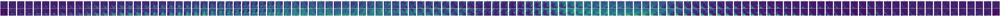

In [9]:
mask_data = _mask
gau_mask = ndata_conv

fig, axes = plt.subplots(2, 120, figsize=(2*120, 4))
for n in range(len(mask_data)):
    
    axes[0, n].imshow(mask_data[n])
    axes[0, n].axis("off")
    axes[0, n].set_title(str(n+1))
    
    axes[1, n].imshow(gau_mask[n])
    axes[1, n].axis("off")
    # axes[1, n].set_title(str(n))

plt.tight_layout()
# plt.savefig("gau_before_after_120.png", dpi=50)
plt.show()

In [ ]:
gau_data = []
for i in range(len(integ12_data)):
    gau = gaussian_filter(integ12_data[i])
    gau_data.append(gau)

norm_gau_data = normalization(gau_data)
print(len(norm_gau_data))

In [ ]:
for m in tqdm(range(len(norm_gau_data) // 10 + 1)):
    m = m * 10
    fig, axes = plt.subplots(1, 10, figsize=(3*10, 3))
    for n in range(10):
        data = norm_gau_data[m + n]
        integ_data = np.nansum(data, axis=0)
        
        colum = (m + n) % 10
        
        axes[colum].imshow(integ_data)
        axes[colum].axis("off")
        axes[colum].set_title(f"cut_number{m + n}")

    # plt.savefig("適当領域_積分.png")
    plt.tight_layout()
    plt.show()

In [12]:
remove_list = [0, 1, 2, 30, 94, 123, 124, 125, 195, 236, 282, 329, 330, 376, 377, 423, 468, 518, 571, 628, 1380, 1507, 1622, 1673, 1803, 1869, 1919, 1938, 1965, 1972]

  0%|          | 0/3 [00:00<?, ?it/s]

NameError: name 'norm_gau_data' is not defined

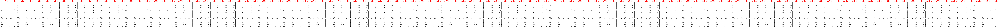

In [13]:
remove_num = [30, 123, 628]
fig, axes = plt.subplots(3, 120, figsize=(120*2, 3*2))
for k in range(120):
    axes[0, k].set_title(f"{k+1}層目", fontsize=20, color='red')
for i in tqdm(range(len(remove_num))):#一層ずつ描画
    data = norm_gau_data[remove_num[i]]

    for j in range(len(data)):
        axes[i, j].imshow(data[j])
        axes[i, j].axis("off")
        
plt.tight_layout()
# plt.savefig(f"error_data_ex_layer120.png", dpi=50)
plt.show()

In [ ]:
# noize_num = 2
# data = norm_gau_data[remove_list[noize_num]]
    
# fig, axes = plt.subplots(1, 12, figsize=(12*2, 3))
# for j in range(len(data)):
#     axes[j].imshow(data[j])
#     axes[j].axis("off")
#     axes[j].set_title(f"{j+1}層目")
        
# # fig.suptitle(f"number{noize_num}", x=0.5, y=0.98, ha='left', fontsize=20, color="r")
# plt.tight_layout()
# plt.savefig(f"CynusX_noize_data_ex{noize_num}")
# plt.show()

In [ ]:
filtered_list = [data for i, data in enumerate(norm_gau_data) if i not in remove_list]
print(len(norm_gau_data))
print(len(remove_list))
print(len(filtered_list))

In [ ]:
random_num = [random.randint(0, len(filtered_list)) for _ in range(5)]
random_num.sort()
print(random_num)

In [ ]:
fig, axes = plt.subplots(5, 120, figsize=(120*2, 5*2))
for k in range(120):
    axes[0, k].set_title(f"{k+1}層目", fontsize=20, color='red')
for i in tqdm(range(len(random_num))):#一層ずつ描画
    data = filtered_list[random_num[i]]

    for j in range(len(data)):
        axes[i, j].imshow(data[j])
        axes[i, j].axis("off")
        
plt.tight_layout()
plt.savefig(f"zeroing_ex.png", dpi=50)
plt.show()

In [ ]:
print(np.max(filtered_list[90]))

In [ ]:
np.save("CygnusX_layer120_zeroing.npy", filtered_list)
# np.save("CygnusX_mask_data_flip_5838", remove_data_flip)

In [17]:
del masked_data, cut_data, remove_nan_cut_data, gau_data, norm_gau_data
gc.collect()  # ガベージコレクションを実行

767752

In [18]:
ud_list = []
lr_list = []
for i in range(len(filtered_list)):
    ud_i = np.flip(filtered_list[i], axis=1)
    lr_i = np.flip(filtered_list[i], axis=2)
    
    ud_list.append(ud_i)
    lr_list.append(lr_i)

print(len(ud_list), len(lr_list))

1946 1946


In [22]:
concate_lr_ud = np.concatenate(np.array(ud_list), np.array(lr_list))
print(len(concate_lr_ud))

TypeError: concatenate() got multiple values for argument 'axis'

In [18]:
rot_90 = []
rot_180 = []
rot_270 = []
for data in filtered_list:
    rotated_90 = np.rot90(data, k=1, axes=(1, 2))
    rotated_180 = np.rot90(data, k=2, axes=(1, 2))
    rotated_270 = np.rot90(data, k=3, axes=(1, 2))
    
    rot_90.append(rotated_90)
    rot_180.append(rotated_180)
    rot_270.append(rotated_270)

print(len(rot_90))
print(len(rot_180))
print(len(rot_270))

1946
1946
1946


In [43]:
shape = filtered_list[0].shape
num_arrays = len(filtered_list)

# メモリマップファイルを作成
memmap_file = "cygnusX_merged_data_11676.npy"
merged_data = np.memmap(memmap_file, dtype=np.float32, mode="w+", shape=(num_arrays * 6, *shape))

# 各データをメモリマップにコピー
merged_data[:num_arrays] = np.array(filtered_list, dtype=np.float32)
merged_data[num_arrays:2*num_arrays] = np.array(ud_list, dtype=np.float32)
merged_data[2*num_arrays:3*num_arrays] = np.array(lr_list, dtype=np.float32)
merged_data[3*num_arrays:4*num_arrays] = np.array(rot_90)
merged_data[4*num_arrays:5*num_arrays] = np.array(rot_180)
merged_data[5*num_arrays:] = np.array(rot_270)

# メモリから解放
del merged_data

In [45]:
check = np.load("/home/cygnus/Downloads/CygnusX/Cygnus-Xのみの実験で使用したnote_book/学習データ作成/cygnusX_merged_data_11676.npy")

ValueError: Cannot load file containing pickled data when allow_pickle=False

In [52]:
memmap_array = np.memmap("cygnusX_merged_data_11676.npy", dtype=np.float32, mode="r", shape=(11676, 120, 112, 112))

In [53]:
len(memmap_array)

11676

In [54]:
random_num = [random.randint(0, len(memmap_array)) for _ in range(5)]
random_num.sort()
print(random_num)

[4098, 4857, 5685, 7335, 10293]


In [1]:
fig, axes = plt.subplots(5, 120, figsize=(120*2, 5*2))
for k in range(120):
    axes[0, k].set_title(f"{k+1}層目", fontsize=20, color='red')
for i in tqdm(range(len(random_num))):#一層ずつ描画
    data = memmap_array[random_num[i]]

    for j in range(len(data)):
        axes[i, j].imshow(data[j])
        axes[i, j].axis("off")
        
plt.tight_layout()
plt.savefig(f"bubble_120_zeroing.png")
plt.show()

NameError: name 'plt' is not defined

In [51]:
memmap_array[0].shape

(112, 112, 120)

In [ ]:
from npy_append_array import NpyAppendArray

# すべてのリストを結合
all_data = filtered_list + ud_list + lr_list

# バッチサイズを設定
batch_size = 100

# ファイル名を指定
file_name = 'cygnusX_layer120_merged_data_all.npy'

# NpyAppendArrayオブジェクトを作成
with NpyAppendArray(file_name) as npy_append_array:
    # バッチごとにデータを処理
    for i in tqdm(range(0, len(all_data), batch_size)):
        batch_data = np.asarray(all_data[i:i + batch_size])
        batch_data = np.ascontiguousarray(batch_data)
        npy_append_array.append(batch_data)

  0%|          | 0/117 [00:00<?, ?it/s]

In [ ]:
from npy_append_array import NpyAppendArray

# すべてのリストを結合
all_data = filtered_list + ud_list + lr_list + rot_90 + rot_180 + rot_270

# バッチサイズを設定
batch_size = 100

# ファイル名を指定
file_name = 'cygnusX_layer120_merged_data_all.npy'

# NpyAppendArrayオブジェクトを作成
cygnusX_layer120_merged_data = NpyAppendArray(file_name)
    
# バッチごとにデータを処理
for i in tqdm(range(0, len(all_data), batch_size)):
    batch_data = np.asarray(all_data[i:i + batch_size])
    batch_data = np.ascontiguousarray(batch_data)
    cygnusX_layer120_merged_data.append(batch_data)

cygnusX_layer120_merged_data.close()

  0%|          | 0/117 [00:00<?, ?it/s]

In [18]:
import numpy as np
from npy_append_array import NpyAppendArray

import psutil
from tqdm.notebook import tqdm

def proccess_npyAppend(file_name, *data):
    all_data = []
    for part in data: 
      all_data += part

    shape = all_data[0].shape
    num_arrays = len(all_data)

    mem = psutil.virtual_memory()
    total = mem.total
    used = mem.used
    free = mem.available
    
    print(f"総メモリ: {total / 2**30:.2f} GB")
    print(f"使用中のメモリ: {used / 2**30:.2f} GB")
    print(f"使用可能なメモリ: {free / 2**30:.2f} GB")
    
    data_byte = np.prod(shape) * 8
    print(f"\n一つあたりのデータ容量: {data_byte/ 2**20:.2f} MB")
    print(f"総データ容量: {(data_byte * num_arrays) / 2**30:.2f} GB")
    
    batch_size = (free // data_byte) // 3
    print(f"\n総データ数: {len(all_data)}")
    print(f"バッチサイズ:\n {batch_size}")

    file_name = file_name + ".npy"
    saved_file = NpyAppendArray(file_name)
    
    for i in tqdm(range(0, len(all_data), batch_size)):
      batch_data = np.asarray(all_data[i:i + batch_size])
      batch_data = np.ascontiguousarray(batch_data)
      saved_file.append(batch_data)

    saved_file.close()
    print("The save has completed!!")
  

In [19]:
proccess_npyAppend("cygnusX_layer120_merged_data_flip.npy", filtered_list, ud_list, lr_list)

総メモリ: 125.74 GB
使用中のメモリ: 60.19 GB
使用可能なメモリ: 64.34 GB

一つあたりのデータ容量: 11.48 MB
総データ容量: 65.47 GB

総データ数: 5838
バッチサイズ:
 1912


  0%|          | 0/4 [00:00<?, ?it/s]

The save has completed!!


# 学習データの描画

In [3]:
training_data = np.load("/home/filament/fujimoto/Cygnus-X_CAE/data/zroing_resize_data/resize_data/CygnusX_cut_resize_to_100x100.npy")